In [229]:
from regression_dependencies import *

### Characterizing dynamic peaks

In [244]:
CT = 'T'

In [245]:
head_folder = "/data/srlab/agupta/data/peak_gene_scores/d12_scores"
fname = "083122_poisson_regression_10PC_all_outputs.csv"
                            
atac_fn = head_folder+'/'+CT+'/'+fname
peak_scores = pd.DataFrame(pd.read_csv(atac_fn,index_col=0))
peak_scores = peak_scores[peak_scores.index.str.contains('chrX')==False]
peak_scores = peak_scores[peak_scores.index.str.contains('chrY')==False]

peak_scores['DYNAMIC'] = [int(i) for i in peak_scores['model_LRT_qval']<0.05]
peak_scores['INVARIANT'] = 1-peak_scores['DYNAMIC']
dynamic_peaks = list(peak_scores[peak_scores['DYNAMIC']==1].index)

dynamic_peaks = peak_scores[peak_scores['DYNAMIC']==1]
invariant_peaks = peak_scores[peak_scores['INVARIANT']==1]
print('num dynamic peaks:', len(dynamic_peaks))
print('num invariant peaks:', len(invariant_peaks))
peak_scores['OPEN'] = [1]*len(peak_scores)

### EXCLUDE INVARIANT PEAKS FROM BEING TESTED FOR PC-BASED ASSOCIATIONS
DYN_peak_scores = peak_scores.loc[:, peak_scores.columns != 'INVARIANT']

zscores = DYN_peak_scores[['PC'+str(i)+' zscore' for i in np.arange(1,11,1)]]
zscores.columns = ['PC'+str(i) for i in np.arange(1,11,1)]
pvals = DYN_peak_scores[['PC'+str(i)+' pval' for i in np.arange(1,11,1)]]
pvals.columns = ['PC'+str(i) for i in np.arange(1,11,1)]
pval_binary = pvals[pvals<0.05].fillna(0)
pval_binary[pval_binary !=0] = 1

#only keep those peaks whose individual pvalues are <0.05:
sig_zscores = zscores[pval_binary==1].fillna(0)

# pos
pos_peaks_df = sig_zscores[sig_zscores>0].fillna(0)
pos_peaks_df[pos_peaks_df!=0]=1
pos_peaks_df.columns = ['PC'+str(i)+'_POS' for i in range(1,11)]
# neg
neg_peaks_df = sig_zscores[sig_zscores<0].fillna(0)
neg_peaks_df[neg_peaks_df!=0]=1
neg_peaks_df.columns = ['PC'+str(i)+'_NEG' for i in range(1,11)]
print(pos_peaks_df.sum(),neg_peaks_df.sum())

DYN_peak_scores['INVARIANT'] = 1-DYN_peak_scores['DYNAMIC']
full_df = pd.concat([DYN_peak_scores[['OPEN','DYNAMIC','INVARIANT']],pos_peaks_df,neg_peaks_df],axis=1)
full_df

num dynamic peaks: 56819
num invariant peaks: 29541
86360
PC1_POS     19943.0
PC2_POS     21097.0
PC3_POS     15212.0
PC4_POS      9371.0
PC5_POS      7372.0
PC6_POS      5689.0
PC7_POS      5848.0
PC8_POS      7650.0
PC9_POS      7023.0
PC10_POS     9856.0
dtype: float64 PC1_NEG     14065.0
PC2_NEG     12772.0
PC3_NEG     13561.0
PC4_NEG     15028.0
PC5_NEG      4815.0
PC6_NEG      6868.0
PC7_NEG      4725.0
PC8_NEG     13920.0
PC9_NEG      5822.0
PC10_NEG     5736.0
dtype: float64


,OPEN,DYNAMIC,INVARIANT,PC1_POS,PC2_POS,PC3_POS,PC4_POS,PC5_POS,PC6_POS,PC7_POS,...,PC1_NEG,PC2_NEG,PC3_NEG,PC4_NEG,PC5_NEG,PC6_NEG,PC7_NEG,PC8_NEG,PC9_NEG,PC10_NEG
chr1:817238-817438,1,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
chr1:827432-827632,1,1,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr1:869776-869976,1,1,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
chr1:904365-904565,1,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr1:904661-904861,1,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr22:50621599-50621799,1,1,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
chr22:50622353-50622553,1,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr22:50628180-50628380,1,1,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
chr22:50672522-50672722,1,0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Meta (across all 5 cell types) z-score-based (1) heatmaps and (2) UMAPs

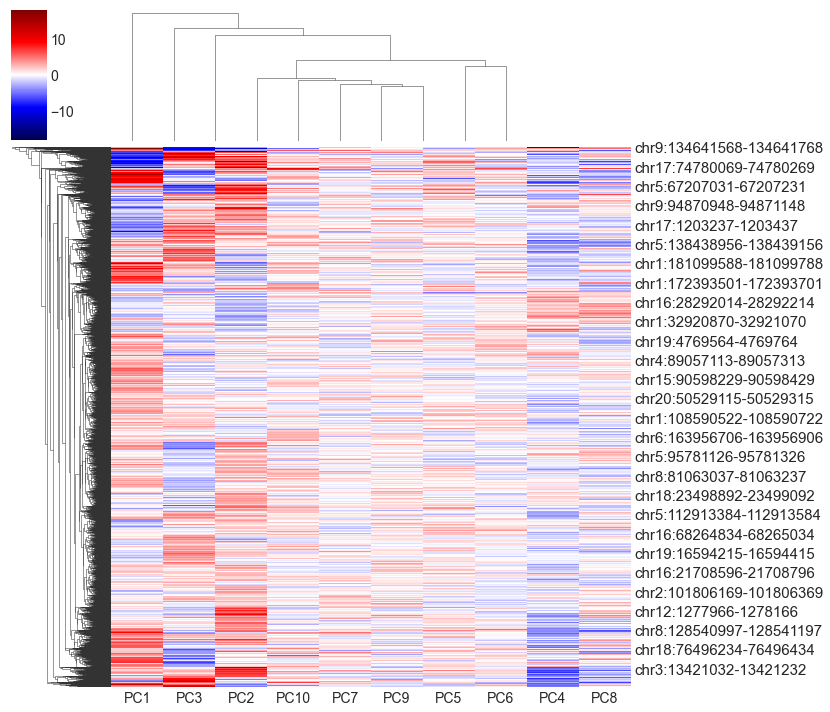

In [ ]:
### subset to dynamic peaks only ###
zscores = zscores.loc[list(dynamic_peaks.index),:]

zscores['SUM']= zscores.sum(axis=1)
zscores_dyn = zscores[zscores['SUM']>0]#.dropna(axis=0)

cm = sns.clustermap(zscores_dyn.iloc[:,:-1],cmap='seismic',vmin=-18,vmax=18)

hm = cm.ax_heatmap.get_position()
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), fontsize=15)
cm.ax_heatmap.set_position([hm.x0, hm.y0, hm.width*1.25, hm.height])
col = cm.ax_col_dendrogram.get_position()

In [18]:
# (1)

cts = ['T','myeloid','B','fibroblast','endothelial']

head_folder = "/data/srlab/agupta/data/peak_gene_scores/d12_scores"
fname = "083122_poisson_regression_10PC_all_outputs.csv"
             
all_zscores = pd.DataFrame()
all_dyn_peaks, all_overall_peaks = [],[]
for ct in cts:
    print(ct)
    atac_fn = head_folder+'/'+ct+'/'+fname #args.cell_type
    peak_scores = pd.DataFrame(pd.read_csv(atac_fn,index_col=0))
    peak_scores = peak_scores[peak_scores.index.str.contains('chrX')==False]
    peak_scores = peak_scores[peak_scores.index.str.contains('chrY')==False]

    peak_scores['DYNAMIC'] = [int(i) for i in peak_scores['model_LRT_qval']<0.05]
    peak_scores['INVARIANT'] = 1-peak_scores['DYNAMIC']
    dynamic_peaks = list(peak_scores[peak_scores['DYNAMIC']==1].index)

    dynamic_peaks = peak_scores[peak_scores['DYNAMIC']==1]
    invariant_peaks = peak_scores[peak_scores['INVARIANT']==1]
    print('num dynamic peaks:', len(dynamic_peaks))
    print('num invariant peaks:', len(invariant_peaks))
    peak_scores['OPEN'] = [1]*len(peak_scores)

    DYN_peak_scores = peak_scores.loc[:, peak_scores.columns != 'INVARIANT'] 
    print(len(DYN_peak_scores))

    zscores = DYN_peak_scores[['PC'+str(i)+' zscore' for i in np.arange(1,11,1)]]
    zscores.columns = [ct+'_PC'+str(i) for i in range(1,11,1)]
    
    ### subset to dynamic peaks only ###
    zscores = zscores.loc[list(dynamic_peaks.index),:]
    
    all_zscores = pd.concat([all_zscores, zscores], axis=1)
    
    all_dyn_peaks.extend(list(dynamic_peaks.index))
    all_overall_peaks.extend(list(peak_scores.index))
    
all_zscores = all_zscores.fillna(0)
#to make sure we truly subsetted to dynamic peaks only
print('num dyn peaks included overall:', len(set(all_dyn_peaks)))
print('num ALL peaks included overall:', len(set(all_overall_peaks)))
all_zscores

T
num dynamic peaks: 56819
num invariant peaks: 29541
86360
myeloid
num dynamic peaks: 76997
num invariant peaks: 34751
111748
B
num dynamic peaks: 12717
num invariant peaks: 44106
56823
fibroblast
num dynamic peaks: 80849
num invariant peaks: 39302
120151
endothelial
num dynamic peaks: 18052
num invariant peaks: 46591
64643
num dyn peaks included overall: 119716
num ALL peaks included overall: 129552


,T_PC1,T_PC2,T_PC3,T_PC4,T_PC5,T_PC6,T_PC7,T_PC8,T_PC9,T_PC10,...,endothelial_PC1,endothelial_PC2,endothelial_PC3,endothelial_PC4,endothelial_PC5,endothelial_PC6,endothelial_PC7,endothelial_PC8,endothelial_PC9,endothelial_PC10
chr1:817238-817438,0.729687,-0.243206,-0.739294,-2.652968,0.773067,-1.052101,1.468673,-1.409220,0.711926,2.941362,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:827432-827632,-0.835847,-3.333023,-0.509765,3.209702,0.494455,0.159618,-0.255022,0.924804,-0.754078,1.079098,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:869776-869976,2.407945,0.343620,-4.164413,1.222670,1.082275,2.891845,-2.209383,-1.089389,0.921212,-0.851972,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:905315-905515,1.831171,1.877656,-2.528867,0.068952,-2.388743,-1.719875,0.332280,-1.271308,-0.842285,-2.333925,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:906754-906954,1.884144,-0.512975,-0.828446,-0.714305,-0.677188,1.044728,-0.546906,-2.257602,-1.953889,0.812278,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr22:41367979-41368179,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.531182,-0.104245,-1.132422,0.055557,-3.206847,-3.088702,-1.530762,-0.889372,0.329497,1.292424
chr22:43993242-43993442,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.902319,-0.413194,-1.420107,-3.941894,0.971236,1.662735,-0.681743,-0.304732,-0.851713,1.123235
chr22:44715013-44715213,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-3.441248,4.135037,-4.251116,-3.213165,3.682211,-1.507455,-2.008514,-0.987862,0.969554,-2.362374
chr22:46575523-46575723,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.704019,-1.263468,-5.499930,-2.663758,-0.047343,-1.458736,1.430883,-0.785041,0.309645,-0.569120


In [20]:
all_zscores_binarized = all_zscores[np.abs(all_zscores)>0]
all_zscores_binarized = all_zscores_binarized.fillna(0)
all_zscores_binarized[np.abs(all_zscores_binarized)>0] = 1
print(len(all_zscores_binarized))

all_zscores_binarized['SUM']=all_zscores_binarized.sum(axis=1)
all_zscores_binarized[all_zscores_binarized['SUM']>0].dropna(axis=0)

119716


,T_PC1,T_PC2,T_PC3,T_PC4,T_PC5,T_PC6,T_PC7,T_PC8,T_PC9,T_PC10,...,endothelial_PC2,endothelial_PC3,endothelial_PC4,endothelial_PC5,endothelial_PC6,endothelial_PC7,endothelial_PC8,endothelial_PC9,endothelial_PC10,SUM
chr1:817238-817438,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0
chr1:827432-827632,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0
chr1:869776-869976,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0
chr1:905315-905515,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0
chr1:906754-906954,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr22:41367979-41368179,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0
chr22:43993242-43993442,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0
chr22:44715013-44715213,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0
chr22:46575523-46575723,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0


/PHShome/ag179/anaconda3/envs/env4/lib/python3.7/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


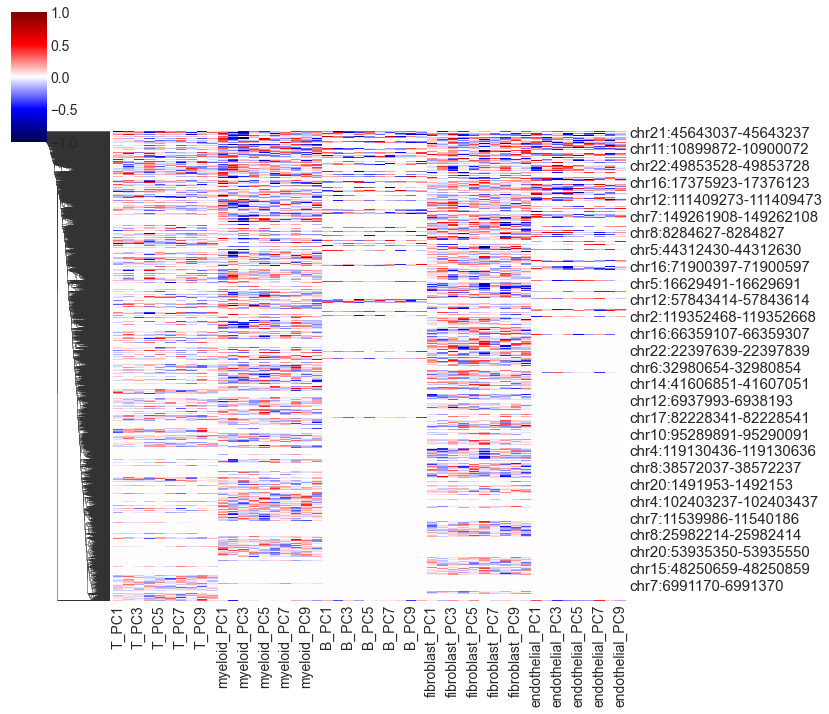

In [22]:
# column normalize z-scores (ie so that PC1 in T cells range maps to PC10 in B cells, for example)
for col in all_zscores.columns:
    all_zscores[col] = all_zscores[col] / np.max(all_zscores[col])

cm = sns.clustermap(all_zscores.iloc[::10,:-1],cmap='seismic',vmin=-1,vmax=1, col_cluster=False)

hm = cm.ax_heatmap.get_position()
plt.setp(cm.ax_heatmap.yaxis.get_majorticklabels(), fontsize=15)
cm.ax_heatmap.set_position([hm.x0, hm.y0, hm.width*1.25, hm.height])
col = cm.ax_col_dendrogram.get_position()
cm.ax_col_dendrogram.set_position([col.x0, col.y0, col.width*0.5, col.height*0.5])

In [33]:
# (2) UMAPs...
import scanpy as sc
all_zscores_adata = anndata.AnnData(all_zscores) ##subsetting peaks here
len(all_zscores_adata.obs_names)
all_zscores_adata.var_names

Index(['T_PC1', 'T_PC2', 'T_PC3', 'T_PC4', 'T_PC5', 'T_PC6', 'T_PC7', 'T_PC8',
       'T_PC9', 'T_PC10', 'myeloid_PC1', 'myeloid_PC2', 'myeloid_PC3',
       'myeloid_PC4', 'myeloid_PC5', 'myeloid_PC6', 'myeloid_PC7',
       'myeloid_PC8', 'myeloid_PC9', 'myeloid_PC10', 'B_PC1', 'B_PC2', 'B_PC3',
       'B_PC4', 'B_PC5', 'B_PC6', 'B_PC7', 'B_PC8', 'B_PC9', 'B_PC10',
       'fibroblast_PC1', 'fibroblast_PC2', 'fibroblast_PC3', 'fibroblast_PC4',
       'fibroblast_PC5', 'fibroblast_PC6', 'fibroblast_PC7', 'fibroblast_PC8',
       'fibroblast_PC9', 'fibroblast_PC10', 'endothelial_PC1',
       'endothelial_PC2', 'endothelial_PC3', 'endothelial_PC4',
       'endothelial_PC5', 'endothelial_PC6', 'endothelial_PC7',
       'endothelial_PC8', 'endothelial_PC9', 'endothelial_PC10'],
      dtype='object')

In [34]:
# calculate neighborhood embeddings
sc.pp.neighbors(all_zscores_adata)
sc.tl.umap(all_zscores_adata)

In [39]:
# sc.tl.leiden(all_zscores_adata)
all_zscores_adata_leiden = sc.read('/data/srlab/agupta/data/d12_matrices/characterizing_dynamic_peaks/092622_dynamic_peaks_zscores_UMAP_adata_wLeiden.h5ad')
all_zscores_adata_leiden

AnnData object with n_obs × n_vars = 119716 × 50
    obs: 'leiden'
    uns: 'leiden', 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

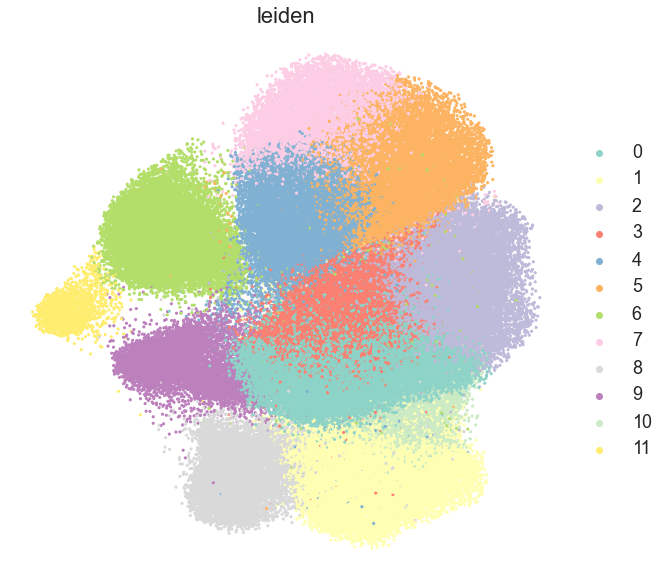

In [56]:
sc.pl.umap(all_zscores_adata_leiden, color='leiden', 
           palette=sns.color_palette("Set3",24), #second number is how many categories there are
           s=40, vmin=-1, vmax=1, ncols=5, frameon=False)

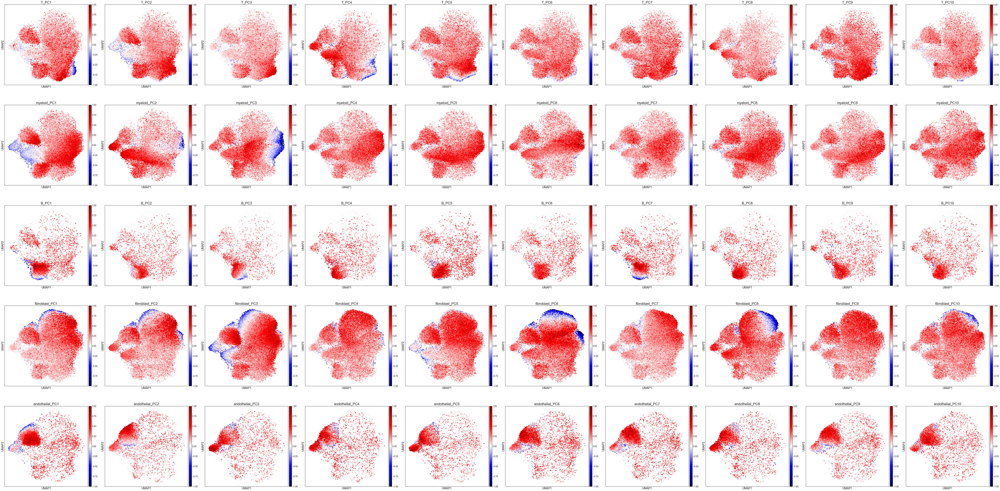

In [46]:
sc.pl.umap(all_zscores_adata_leiden, color=list(all_zscores.columns), 
           cmap='seismic', 
           s=100, vmin=-1, vmax=1, ncols=10)

In [323]:
## adding regression p-values for each cell type to each peak, and plotting with those colors

all_ct_reg_pvals_df = pd.DataFrame()
for CT in ['B','T','endothelial','myeloid','fibroblast']:
    peaks_CT_reg_df = pd.DataFrame(pd.read_csv('/data/srlab/agupta/data/peak_gene_scores/d12_scores/'+CT+'/083122_poisson_regression_10PC_all_outputs.csv',index_col=0))
    peaks_CT_reg_pvals = pd.DataFrame(-np.log10(peaks_CT_reg_df['model_LRT_qval']))
    peaks_CT_reg_pvals.columns = [CT+'_reg_-log10(qval)']
    all_ct_reg_pvals_df = pd.concat([all_ct_reg_pvals_df, peaks_CT_reg_pvals],axis=1)
    
#make all nonsig peaks have a pval or qval = 0 (so they aren't shaded in the UMAP)
all_ct_reg_pvals_df[all_ct_reg_pvals_df<=1.3] = 0 #1.3 = -log10(0.05) #MH-adjusted significant

all_ct_reg_pvals_df = all_ct_reg_pvals_df.fillna(0)
all_ct_reg_pvals_df

/PHShome/ag179/anaconda3/envs/env4/lib/python3.7/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,B_reg_-log10(qval),T_reg_-log10(qval),endothelial_reg_-log10(qval),myeloid_reg_-log10(qval),fibroblast_reg_-log10(qval)
chr1:827432-827632,1.811264,3.167213,0.0,0.000000,1.344901
chr1:869776-869976,0.000000,4.450215,0.0,3.330148,0.000000
chr1:904365-904565,0.000000,0.000000,0.0,0.000000,1.920733
chr1:904661-904861,0.000000,0.000000,0.0,0.000000,1.804547
chr1:905315-905515,1.547222,3.744253,0.0,1.620992,0.000000
...,...,...,...,...,...
chrX:151697607-151697807,0.000000,0.000000,0.0,0.000000,27.336533
chrX:151789224-151789424,0.000000,0.000000,0.0,0.000000,4.349690
chrX:151826162-151826362,0.000000,0.000000,0.0,0.000000,51.588676
chrX:151970729-151970929,0.000000,0.000000,0.0,0.000000,25.557126


In [1]:
# color UMAPs by pvalue of each peak in each cell type's regression

from matplotlib.colors import LinearSegmentedColormap
ct_colors = ['#F8766D','#F892EB','#00BA38','#619CFF','#00BFC4']
maxes = [i for i in [10, 50, 10, 50, 50]]

## ALL peaks or DYNAMIC peaks (choose file accordingly)
adata_to_plot = sc.read('/data/srlab/agupta/data/d12_matrices/characterizing_dynamic_peaks/092622_dynamic_peaks_zscores_UMAP_adata.h5ad')
for col in all_ct_reg_pvals_df.columns:
    adata_to_plot.obs[col] = all_ct_reg_pvals_df[col]

#loop through cell types
for i in range(len(all_ct_reg_pvals_df.columns)):
    color2 = ct_colors[i]
    colors = ['#FFFFFF', color2]
    cm = LinearSegmentedColormap.from_list("Custom", colors, N=20)

    sc.pl.umap(adata_to_plot, 
               color=all_ct_reg_pvals_df.columns[i], cmap=cm, s=100, ncols=5,frameon=False,
               vmin=0, vmax=maxes[i])

<AxesSubplot:>

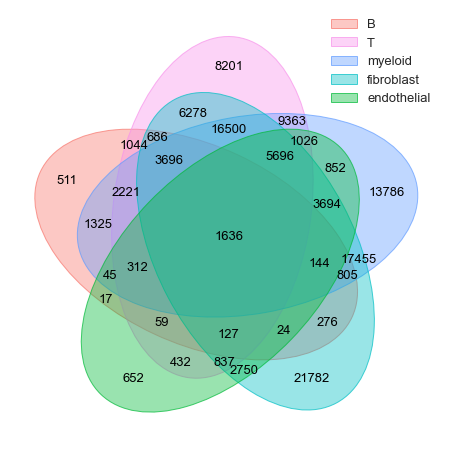

In [336]:
#make a venn diagram of all shared, significant peaks across the 5 cell types

all_ct_reg_pvals_df_up = all_ct_reg_pvals_df.copy()
all_ct_reg_pvals_df_up[all_ct_reg_pvals_df_up>0]=1

from venn import venn
# example here: https://github.com/LankyCyril/pyvenn/blob/master/pyvenn-demo.ipynb
nonzeros=defaultdict()
nonzeros['B']=set(np.array(all_ct_reg_pvals_df_up['B_reg_-log10(qval)']).nonzero()[0])
nonzeros['T']=set(np.array(all_ct_reg_pvals_df_up['T_reg_-log10(qval)']).nonzero()[0])
nonzeros['myeloid']=set(np.array(all_ct_reg_pvals_df_up['myeloid_reg_-log10(qval)']).nonzero()[0])
nonzeros['fibroblast']=set(np.array(all_ct_reg_pvals_df_up['fibroblast_reg_-log10(qval)']).nonzero()[0])
nonzeros['endothelial']=set(np.array(all_ct_reg_pvals_df_up['endothelial_reg_-log10(qval)']).nonzero()[0])
venn(nonzeros,cmap=['#F8766D','#F892EB','#619CFF','#00BFC4','#00BA38'])

In [333]:
#UPSET PLOT (peaks X cell types, based on significance)

all_ct_reg_pvals_df_forUpsetplot = all_ct_reg_pvals_df.astype(bool).set_index(list(all_ct_reg_pvals_df.columns))
all_ct_reg_pvals_df_forUpsetplot

Empty DataFrame
Columns: []
Index: [(True, True, False, False, True), (False, True, False, True, False), (False, False, False, False, True), (False, False, False, False, True), (True, True, False, True, False), (False, True, False, True, True), (True, True, False, True, True), (False, True, False, True, False), (False, False, False, False, True), (False, True, False, True, True), (False, True, False, True, True), (False, True, True, True, True), (False, True, True, True, True), (False, True, True, True, True), (False, True, False, False, True), (False, False, False, True, True), (False, False, True, False, False), (False, True, False, True, True), (False, True, True, True, True), (True, False, False, True, True), (False, False, False, True, False), (False, False, False, True, True), (False, True, False, True, True), (True, True, False, True, True), (False, True, False, True, True), (False, False, False, True, True), (False, True, True, True, True), (True, True, False, True, False), (False, False, False, False, True), (True, True, True, True, True), (True, True, False, True, True), (False, True, True, True, True), (False, True, False, True, True), (True, True, True, True, True), (True, True, False, True, False), (False, True, True, True, True), (False, True, False, True, True), (True, True, False, True, True), (False, True, False, True, True), (False, True, True, True, True), (False, True, False, True, True), (False, True, False, True, True), (False, True, True, True, True), (True, False, False, True, False), (True, True, False, True, False), (True, True, False, True, False), (True, False, True, True, False), (False, False, False, False, True), (False, True, True, True, True), (True, True, True, True, True), (False, True, True, True, True), (True, True, False, True, True), (False, True, False, True, False), (False, True, True, True, False), (False, True, False, True, False), (False, True, False, True, True), (False, True, False, True, True), (False, False, False, True, True), (False, False, False, True, True), (True, True, True, True, True), (False, True, True, True, True), (False, True, False, True, True), (False, True, True, True, True), (False, True, True, True, True), (False, False, True, False, False), (False, True, False, True, True), (False, True, False, False, True), (False, True, False, True, True), (False, False, False, False, True), (False, True, False, True, True), (False, False, False, True, False), (True, True, True, True, True), (True, True, True, True, True), (False, True, False, True, False), (False, True, False, True, True), (False, False, False, False, False), (False, True, False, True, False), (False, False, False, True, False), (False, True, False, True, True), (False, True, False, True, True), (False, True, False, False, True), (False, False, False, False, True), (False, True, False, True, False), (False, True, False, True, True), (False, True, False, True, False), (False, True, False, True, True), (False, True, False, True, True), (False, True, False, True, True), (False, False, False, True, True), (False, True, False, False, True), (False, True, False, False, False), (False, True, False, True, False), (False, True, False, False, False), (True, True, False, True, False), (False, True, True, True, True), (False, True, False, False, True), (False, False, False, True, True), (True, True, False, False, False), (False, True, True, True, True), (False, False, False, True, False), ...]

[132466 rows x 0 columns]

In [372]:
#how to get the num of peaks for each group:
all_ct_reg_pvals_df_forUpsetplot.reset_index().sum(axis=1)

#number of accessible but invariant peaks (ie those that are not dynamic in ANY cell type)
sum(all_ct_reg_pvals_df_forUpsetplot.reset_index().sum(axis=1)==0)

#peaks dynamic in at least one cell type
119716-sum(all_ct_reg_pvals_df_forUpsetplot.reset_index().sum(axis=1)==0)

109482

In [398]:
# get all dynamic and all invariant peaks
pks_for_EP = pd.DataFrame(np.array(all_ct_reg_pvals_df_forUpsetplot.reset_index().sum(axis=1)),
             index=all_ct_reg_pvals_df.index)

inv_pks_for_EP = pks_for_EP[pks_for_EP==0].dropna(axis=0)
dyn_pks_for_EP = pks_for_EP[pks_for_EP>0].dropna(axis=0)

dyn_pks_for_EP, inv_pks_for_EP

(                            0
 chr1:827432-827632        3.0
 chr1:869776-869976        2.0
 chr1:904365-904565        1.0
 chr1:904661-904861        1.0
 chr1:905315-905515        3.0
 ...                       ...
 chrX:151697607-151697807  1.0
 chrX:151789224-151789424  1.0
 chrX:151826162-151826362  1.0
 chrX:151970729-151970929  1.0
 chrX:151982272-151982472  1.0
 
 [122232 rows x 1 columns],
                             0
 chr1:1471006-1471206      0.0
 chr1:1861103-1861303      0.0
 chr1:2226816-2227016      0.0
 chr1:2230743-2230943      0.0
 chr1:2544001-2544201      0.0
 ...                       ...
 chrX:9337147-9337347      0.0
 chrX:13377466-13377666    0.0
 chrX:18833387-18833587    0.0
 chrX:70168708-70168908    0.0
 chrX:140765103-140765303  0.0
 
 [10234 rows x 1 columns])

{'matrix': <AxesSubplot:>,
 'shading': <AxesSubplot:>,
 'totals': <AxesSubplot:>,
 'intersections': <AxesSubplot:xlabel='Intersection size'>}

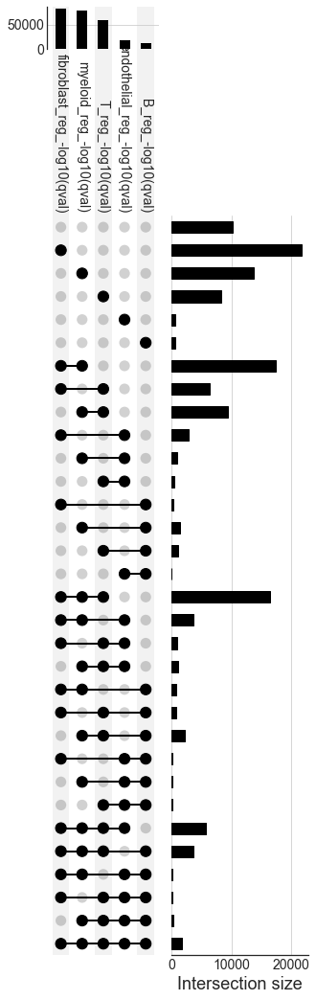

In [334]:
from upsetplot import plot
plot(all_ct_reg_pvals_df_forUpsetplot, orientation='vertical')

#### now, map a few of these sets of peaks onto where they fall in the RNA-based UMAPs
- shade by peak set's average accessibility in each cell

In [127]:
## select a few clusters / groups of peaks to plot, and plot them on these ^ RNA UMAP coordinates to see where they fall
RNA_all = sc.read('/data/srlab/agupta/data/d12_matrices/characterizing_dynamic_peaks/ALL_RNA_adata.h5ad') #OR ALL_RNA_5kGenes_adata
RNA_subset = sc.read('/data/srlab/agupta/data/d12_matrices/characterizing_dynamic_peaks/ALL_RNA_5kGenes_adata.h5ad') #OR ALL_RNA_5kGenes_adata

print('RNA 5k variable genes:', RNA_subset)

ATAC = sc.read("/data/srlab/agupta/data/d12_matrices/processed_h5ads/peaksXcells_ALL_norm_scaled.h5ad")
print(ATAC)

RNA 5k variable genes: AnnData object with n_obs × n_vars = 28694 × 5000
    obs: 'ct', 'ct_subtype', 'donor', 'n_genes', 'total_counts', 'percent_mito', 'donor_num'
    var: 'n_cells', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'ct_colors', 'ct_subtype_colors', 'donor_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmonized_pca', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 31547 × 132520
    obs: 'ct', 'ct_subtype'


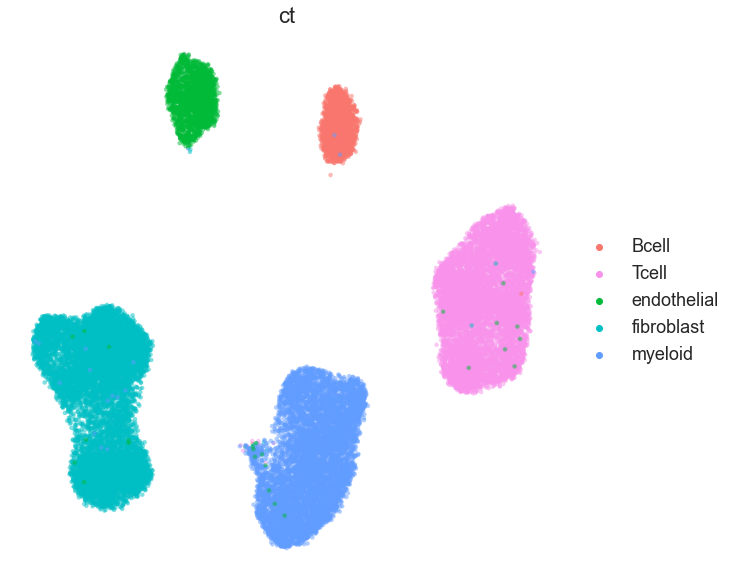

In [5]:
sc.pl.umap(RNA_subset, color=['ct'],
           size=80, frameon=False, palette=['#F8766D','#F892EB','#00BA38','#00BFC4','#619CFF'],
          alpha=0.5)

In [ ]:
df_use = all_zscores_adata_leiden #dynamic peaks only

all_peaks_df = pd.DataFrame()
all_peaks_df.index = list(ATAC.var_names)
all_peaks_df = pd.concat([all_peaks_df,df_use.obs],axis=1)#.fillna(-1)

In [152]:
#(1) sum up peak counts for peaks in each cluster (each cell should have 1 number per cluster)
#(2) each cell should also have 2 dims for RNA-UMAP coords
# then, plot RNA UMAP coords, colored by peak cluster counts

ATAC.var['leiden'] = list(all_peaks_df['leiden'])

ATAC_use = ATAC

for cluster_i in set(ATAC_use.var['leiden']):
    cluster_peak_sum = ATAC_use[:,ATAC_use.var['leiden']==cluster_i].X.sum(axis=1)
    num_peaks_in_cluster = ATAC_use[:,ATAC_use.var['leiden']==cluster_i].X.A.shape[1]
    cluster_peak_mean = cluster_peak_sum/(num_peaks_in_cluster) #ATAC_use[:,ATAC_use.var['leiden']==cluster_i].X.mean(axis=1)
    print('calculating cluster sums and means')
    ATAC_use.obs['peak_sum_leiden_cluster_'+str(cluster_i)] = cluster_peak_sum
    ATAC_use.obs['peak_mean_leiden_cluster_'+str(cluster_i)] = cluster_peak_mean


calculating cluster sums and means
calculating cluster sums and means


/PHShome/ag179/anaconda3/envs/env4/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means
calculating cluster sums and means


In [153]:
ATAC_use = ATAC_use[RNA_subset.obs_names,:]
ATAC_use.obsm['X_umap'] = RNA_subset.obsm['X_umap']
ATAC_use

AnnData object with n_obs × n_vars = 28694 × 132520
    obs: 'ct', 'ct_subtype', 'peak_sum_leiden_cluster_3', 'peak_mean_leiden_cluster_3', 'peak_sum_leiden_cluster_nan', 'peak_mean_leiden_cluster_nan', 'peak_sum_leiden_cluster_6', 'peak_mean_leiden_cluster_6', 'peak_sum_leiden_cluster_7', 'peak_mean_leiden_cluster_7', 'peak_sum_leiden_cluster_9', 'peak_mean_leiden_cluster_9', 'peak_sum_leiden_cluster_1', 'peak_mean_leiden_cluster_1', 'peak_sum_leiden_cluster_0', 'peak_mean_leiden_cluster_0', 'peak_sum_leiden_cluster_10', 'peak_mean_leiden_cluster_10', 'peak_sum_leiden_cluster_11', 'peak_mean_leiden_cluster_11', 'peak_sum_leiden_cluster_4', 'peak_mean_leiden_cluster_4', 'peak_sum_leiden_cluster_8', 'peak_mean_leiden_cluster_8', 'peak_sum_leiden_cluster_5', 'peak_mean_leiden_cluster_5', 'peak_sum_leiden_cluster_2', 'peak_mean_leiden_cluster_2'
    var: 'leiden'
    obsm: 'X_umap'

**heatmap of peak clusters' accessibility in each cell type (means)**

In [154]:
dyn_peaks_dotplot = list(ATAC_use.var[ATAC_use.var['leiden'].isin([str(i) for i in np.arange(0,16,1)])].index)
ATAC_dotplot = ATAC_use[:,dyn_peaks_dotplot]

In [155]:
ct_peakcluster_access_df = pd.DataFrame()
for ct in ['Bcell','Tcell','myeloid','fibroblast','endothelial']:   
    ct_forHeatmap = ATAC_dotplot[ATAC_dotplot.obs['ct']==ct]
    ct_access = []
    for cluster in np.arange(0,12,1):
        mean_ct_cluster_access = np.mean(ct_forHeatmap.obs['peak_mean_leiden_cluster_'+str(cluster)])
        ct_access.append(mean_ct_cluster_access)
        
    ct_peakcluster_access_df[ct] = ct_access

ct_peakcluster_access_df = ct_peakcluster_access_df.loc[[8,1,9,10,11,0,2,3,4,5,7,6],:]
ct_peakcluster_access_df

,Bcell,Tcell,myeloid,fibroblast,endothelial
8,0.094880,0.055647,0.050520,0.022099,0.027556
1,0.041573,0.070678,0.030584,0.024726,0.027632
9,0.090200,0.102924,0.057923,0.053899,0.075585
10,0.045680,0.068939,0.045219,0.020010,0.022144
11,0.098370,0.113748,0.060682,0.061980,0.092271
0,0.043466,0.030200,0.069087,0.019891,0.024065
2,0.010578,0.011068,0.063024,0.040045,0.022085
3,0.033098,0.027977,0.049179,0.036851,0.034507
4,0.030479,0.033871,0.030609,0.048207,0.034433
5,0.007574,0.008435,0.011455,0.073223,0.018043


<Figure size 216x216 with 0 Axes>

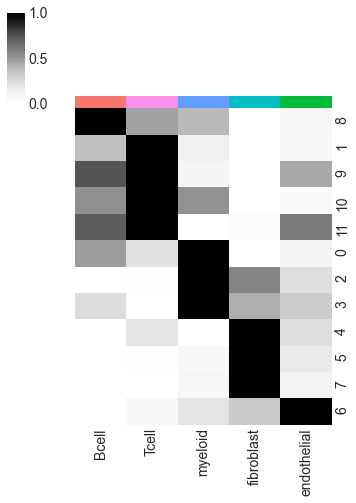

In [156]:
from matplotlib.colors import LinearSegmentedColormap
colors = ['white', 'darkred']
cm = LinearSegmentedColormap.from_list("Custom", colors, N=40)

plt.figure(figsize=(3,3))
sns.clustermap(ct_peakcluster_access_df,
               cmap='Greys',
               figsize=(5,7),
               row_cluster=False,col_cluster=False,
               col_colors=['#F8766D','#F892EB','#619CFF','#00BFC4','#00BA38'], standard_scale=0)# ,
               # standard_scale=0)#, vmax=0.1,vmin=0) #standard_scale=0, vmax=0.08,

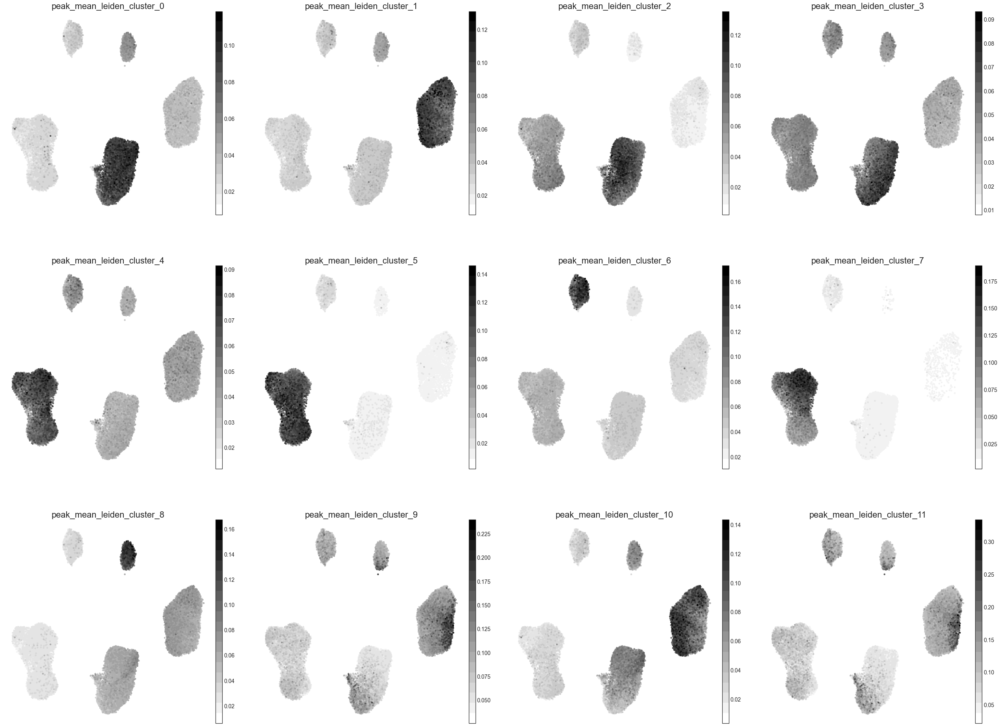

In [159]:
from matplotlib.colors import LinearSegmentedColormap
# these are the RNA UMAPs, colored by peak cluster means
clusters_plot = ['peak_mean_leiden_cluster_'+str(i) for i in np.arange(0,12,1)]

colors = ['#FFFFFF', 'black']
cm = LinearSegmentedColormap.from_list("Custom", colors, N=20)

sc.pl.umap(ATAC_use, color=clusters_plot, #[ATAC.obs['ct']=='myeloid']
               size=80, frameon=False, cmap=cm, ncols=4)#,colorbar_loc=None) #,vmax=1000)

### Individual T cell-PC scores

In [3]:
T_PC_loadings = pd.read_csv("/data/srlab/agupta/data/d12_matrices/cellPC-loadings/T_RNA_PC_loadings_noScaling.csv",index_col=0)

Trying to set attribute `.obs` of view, copying.


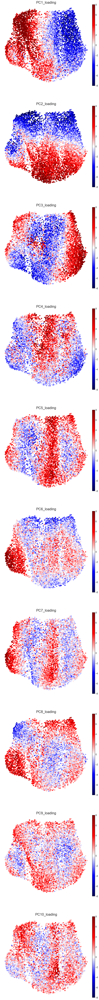

In [79]:
T_cells_RNA_adata = sc.read("/data/srlab/agupta/data/d12_matrices/processed_h5ads/T_RNA_adata.h5ad")
T_cells_RNA_adata = T_cells_RNA_adata[list(T_PC_loadings.index),:]
T_cells_RNA_adata.obs['PC1_loading'] = list(T_PC_loadings['PC1'])
T_cells_RNA_adata.obs['PC2_loading'] = list(T_PC_loadings['PC2'])
T_cells_RNA_adata.obs['PC3_loading'] = list(T_PC_loadings['PC3'])
T_cells_RNA_adata.obs['PC4_loading'] = list(T_PC_loadings['PC4'])
T_cells_RNA_adata.obs['PC5_loading'] = list(T_PC_loadings['PC5'])
T_cells_RNA_adata.obs['PC6_loading'] = list(T_PC_loadings['PC6'])
T_cells_RNA_adata.obs['PC7_loading'] = list(T_PC_loadings['PC7'])
T_cells_RNA_adata.obs['PC8_loading'] = list(T_PC_loadings['PC8'])
T_cells_RNA_adata.obs['PC9_loading'] = list(T_PC_loadings['PC9'])
T_cells_RNA_adata.obs['PC10_loading'] = list(T_PC_loadings['PC10'])

colors = ['#FFFFFF', 'black']# '#F892EB']
cm = LinearSegmentedColormap.from_list("Custom", colors, N=40)
                                  
sc.pl.umap(T_cells_RNA_adata,
               size=200, frameon=False, 
           color=['PC1_loading','PC2_loading','PC3_loading','PC4_loading','PC5_loading',
                 'PC6_loading','PC7_loading','PC8_loading','PC9_loading','PC10_loading'], 
           cmap='seismic',ncols=1,vmin=-8,vmax=8)

In [870]:
#load in normed/scaled/TF-IDF'd ATAC data
ATAC_T_normed = sc.read("/data/srlab/agupta/data/d12_matrices/processed_h5ads/peaksXcells_T_norm_scaled.h5ad")
ATAC_T_normed = ATAC_T_normed[list(T_cells_RNA_adata.obs_names),]
print(ATAC_T_normed)

View of AnnData object with n_obs × n_vars = 7936 × 132520
    obs: 'ct', 'ct_subtype'


In [1040]:
# bin the normed ATAC counts for the 3 peaks that we choose to plot in fig2b:

fig2_peaks = ['chr6:167119769-167119969','chr12:9761393-9761593','chr17:76737400-76737600']
peaks_fig2_counts = pd.DataFrame(ATAC_T_normed[:,fig2_peaks].X.A)#[0]
peaks_fig2_counts.columns = ['chr6:167119769-167119969','chr12:9761393-9761593','chr17:76737400-76737600']
peaks_fig2_counts.index = ATAC_T_normed.obs_names
peaks_fig2_counts

num_bins=500
for peak in fig2_peaks:
    peaks_fig2_counts[peak+"_bin"] = [i for i in pd.qcut(peaks_fig2_counts[peak], num_bins, duplicates='drop', labels=False)]

for peak in fig2_peaks:
    bin_to_avg_dict = dict(peaks_fig2_counts.groupby(peak+"_bin").mean()[peak])
    peaks_fig2_counts[peak+'_bin_mean'] = list(peaks_fig2_counts[peak+"_bin"].map(bin_to_avg_dict))
    
peaks_fig2_counts

,chr6:167119769-167119969,chr12:9761393-9761593,chr17:76737400-76737600,chr6:167119769-167119969_bin,chr12:9761393-9761593_bin,chr17:76737400-76737600_bin,chr6:167119769-167119969_bin_mean,chr12:9761393-9761593_bin_mean,chr17:76737400-76737600_bin_mean
BRI-1281_AAACATGCATTGCAGC,0.000000,0.000000,0.000000,0,0,0,0.001275,0.000838,0.000000
BRI-1281_AAACCAACAAACGCGA,0.000000,0.000000,0.000000,0,0,0,0.001275,0.000838,0.000000
BRI-1281_AAATCCGGTTCATTTG,0.000000,0.000000,0.000000,0,0,0,0.001275,0.000838,0.000000
BRI-1281_AACCTCACAGGCATCT,0.000000,0.000000,0.000000,0,0,0,0.001275,0.000838,0.000000
BRI-1281_AACCTCCTCGCTAGTG,0.000000,1.104132,0.236054,0,66,211,0.001275,1.102869,0.235885
...,...,...,...,...,...,...,...,...,...
BRI-1611_TTTGTGTTCCTAAATG,0.000000,0.000000,0.137657,0,0,58,0.001275,0.000838,0.137935
BRI-1611_TTTGTGTTCTTAATGG,0.000000,0.000000,0.179364,0,0,141,0.001275,0.000838,0.179167
BRI-1611_TTTGTGTTCTTTGAGA,0.000000,0.000000,0.000000,0,0,0,0.001275,0.000838,0.000000
BRI-1611_TTTGTTGGTTATAGCG,1.646579,0.000000,0.280836,57,0,240,1.630898,0.000838,0.281861


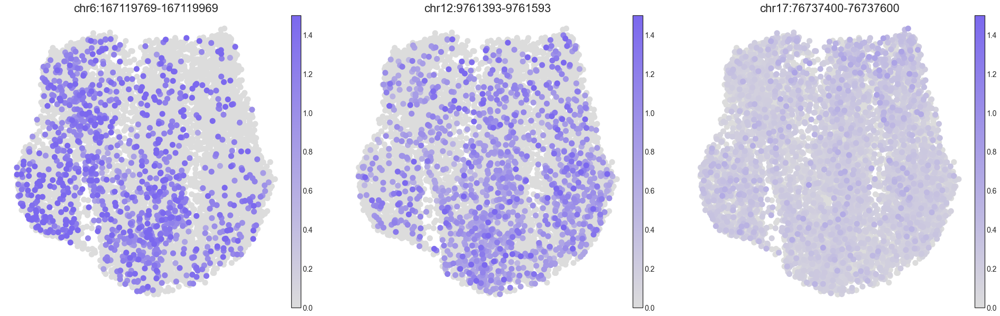

In [1042]:
# for peaks of interest, add the peaks' normalized counts to the RNA UMAP adata
T_cells_RNA_adata.obs['chr17:35880348-35880548'] = ATAC_T_normed[:,'chr17:35880348-35880548'].X.A.T[0]
T_cells_RNA_adata.obs['chr6:167119769-167119969'] = ATAC_T_normed[:,'chr6:167119769-167119969'].X.A.T[0]
T_cells_RNA_adata.obs['chr12:9761393-9761593'] = ATAC_T_normed[:,'chr12:9761393-9761593'].X.A.T[0]

for peak in fig2_peaks:
    T_cells_RNA_adata.obs[peak] = peaks_fig2_counts[peak+'_bin_mean']

colors = ['gainsboro', 'mediumslateblue']
cm = LinearSegmentedColormap.from_list("Custom", colors, N=8000)
sc.pl.umap(T_cells_RNA_adata, size=500, frameon=False,
           color=fig2_peaks, #subset_peaks,
           cmap=cm,vmin=0,vmax=1.5)

In [874]:
#plot line plots for peak accessibility across cells (binned, cell loadings)

for peak in peaks_to_plot:
    T_PC_loadings[peak] = ATAC_T_normed[:,peak].X.A.T[0]

# #bin cell-trait scores into 100 bins total
num_bins = 10
T_PC_loadings['binned_PC1_score'] = [i for i in pd.qcut(T_PC_loadings['PC1'], num_bins,labels = False)]
T_PC_loadings['binned_PC2_score'] = [i for i in pd.qcut(T_PC_loadings['PC2'], num_bins,labels = False)]
T_PC_loadings.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,chr2:231708270-231708470,chr3:9397416-9397616,chr4:152536130-152536330,chr11:13668482-13668682,chr12:130871824-130872024,chr13:45341293-45341493,chr13:110715479-110715679,chr17:76737400-76737600,chr19:4791350-4791550,chr22:20858754-20858954
BRI-1281_AAACATGCATTGCAGC,-1.278676,5.322769,-1.154387,-2.198566,0.183908,-0.604933,-2.588148,-0.630375,-0.562474,0.607866,...,0.273120,0.281536,0.272773,0.0,0.000000,0.000000,0.273686,0.000000,0.277518,0.000000
BRI-1281_AAACCAACAAACGCGA,-4.951617,-2.964020,-4.199985,-2.103815,1.436764,-0.799854,0.157918,-1.229237,0.576359,2.306242,...,0.266028,0.274254,0.000000,0.0,0.000000,0.000000,0.266581,0.000000,0.000000,0.000000
BRI-1281_AAATCCGGTTCATTTG,-0.105024,-0.597908,-1.949780,3.949129,6.202050,-1.644127,3.719721,-2.601497,0.489608,4.213336,...,0.190011,0.196111,0.000000,0.0,0.182648,0.174307,0.190420,0.000000,0.193197,0.184201
BRI-1281_AACCTCACAGGCATCT,-6.805779,-3.308411,1.278042,-1.582421,0.229526,-1.635946,-0.199300,-1.460013,-2.763897,2.135691,...,0.247849,0.255582,0.247531,0.0,0.238500,0.000000,0.248369,0.000000,0.251889,0.240473
BRI-1281_AACCTCCTCGCTAGTG,-0.447833,0.589040,-5.583413,0.133618,1.340052,-0.710203,-0.641495,1.857557,3.138840,0.054772,...,0.000000,0.243435,0.235723,0.0,0.000000,0.000000,0.000000,0.236054,0.239898,0.000000


chr6:167119769-167119969


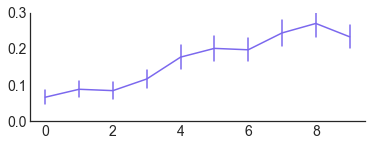

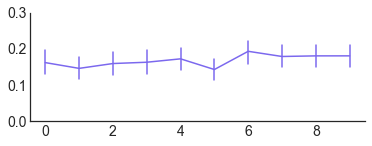

chr12:9761393-9761593


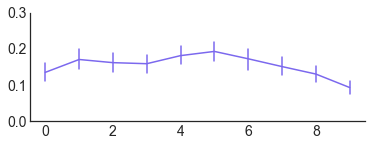

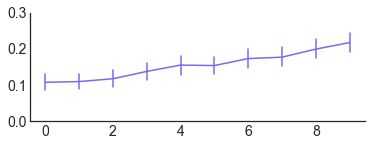

chr17:76737400-76737600


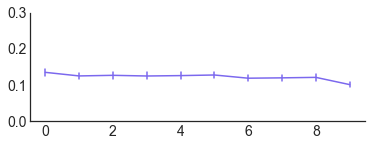

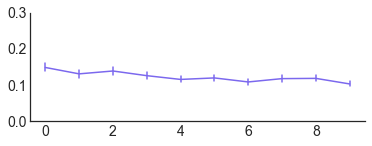

In [937]:
for peak in ['chr6:167119769-167119969','chr12:9761393-9761593','chr17:76737400-76737600']:
    print(peak)
    plt.figure(figsize=(6,2))
    sns.lineplot(data=T_PC_loadings, x='binned_PC1_score',y=peak,color='mediumslateblue', err_style="bars", ci=95)
    # sns.stripplot(data=T_PC_loadings, x='binned_PC1_score',y=peak,color='mediumslateblue')#, jitter=False)#,size=3)#,jitter=False)
    # sns.boxplot(data=T_PC_loadings, x='binned_PC1_score',y=peak,color='mediumslateblue')
    plt.ylim(0,0.3)
    plt.xlabel("")
    plt.ylabel("")
    sns.despine()
    plt.show()

    plt.figure(figsize=(6,2))
    # sns.boxplot(data=T_PC_loadings, x='binned_PC2_score',y=peak,color='mediumslateblue')
    # sns.stripplot(data=T_PC_loadings, x='binned_PC2_score',y=peak,color='mediumslateblue')#, jitter=False)#,size=3)#,jitter=False)
    sns.lineplot(data=T_PC_loadings, x='binned_PC2_score',y=peak,color='mediumslateblue', err_style="bars", ci=95)
    plt.ylim(0,0.3)
    plt.xlabel("")
    plt.ylabel("")
    sns.despine()
    plt.show()

In [40]:
#read in all PEAK Z-scores for PC1 and PC2 (in T cells) -- from the regressions
peak_zscores_df = pd.DataFrame(pd.read_csv('/data/srlab/agupta/data/peak_gene_scores/d12_scores/T/083122_poisson_regression_10PC_all_outputs.csv',index_col=0))
peak_zscores_df

,model_LRT_pval,model_LRT_qval,PC1 zscore,PC2 zscore,PC3 zscore,PC4 zscore,PC5 zscore,PC6 zscore,PC7 zscore,PC8 zscore,...,PC1 qval,PC2 qval,PC3 qval,PC4 qval,PC5 qval,PC6 qval,PC7 qval,PC8 qval,PC9 qval,PC10 qval
chr1:817238-817438,2.925967e-04,6.695097e-04,0.729687,-0.243206,-0.739294,-2.652968,0.773067,-1.052101,1.468673,-1.409220,...,0.633645,0.889551,0.662530,0.048134,0.802501,0.699467,0.594857,0.406300,0.810300,0.055787
chr1:827432-827632,2.977326e-04,6.804351e-04,-0.835847,-3.333023,-0.509765,3.209702,0.494455,0.159618,-0.255022,0.924804,...,0.577122,0.004688,0.778239,0.012041,0.887822,0.967362,0.957248,0.629367,0.796751,0.626595
chr1:869776-869976,1.269287e-05,3.546377e-05,2.407945,0.343620,-4.164413,1.222670,1.082275,2.891845,-2.209383,-1.089389,...,0.051738,0.838089,0.000305,0.458869,0.695086,0.092092,0.317121,0.551619,0.738486,0.720968
chr1:904365-904565,6.386862e-01,6.734318e-01,0.964979,-1.134437,-0.406471,-0.328782,0.655132,0.298221,-1.524404,-0.614468,...,0.509507,0.426182,0.828130,0.876201,0.841514,0.934714,0.574444,0.769909,0.832974,0.466692
chr1:904661-904861,5.430631e-01,5.848657e-01,0.360623,0.298311,-0.698859,0.650305,-1.127591,-0.532499,-0.432626,0.192618,...,0.828936,0.861496,0.682510,0.732758,0.676468,0.872039,0.921617,0.936300,0.621583,0.667642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chrX:155612494-155612694,3.972002e-05,1.036993e-04,-0.294879,3.317889,0.076950,-1.447093,2.270254,0.499775,-1.408281,-2.923496,...,0.862023,0.004916,0.970881,0.360043,0.250560,0.881736,0.617255,0.031868,0.175801,0.993965
chrX:155612853-155613053,1.241880e-01,1.627218e-01,-0.141268,1.486357,-0.172893,-1.827752,1.112359,-0.241472,-0.634369,-2.138629,...,0.936696,0.272462,0.932890,0.218210,0.682418,0.948969,0.872500,0.151915,0.678148,0.698453
chrX:155767531-155767731,4.568222e-13,2.632295e-12,1.735466,4.281384,-5.165559,1.699534,-0.933960,-3.707173,2.348164,3.865072,...,0.186880,0.000170,0.000004,0.261696,0.749397,0.014656,0.269105,0.002394,0.786551,0.724937
chrX:155820209-155820409,7.774856e-01,7.995199e-01,-1.139009,1.213624,0.691073,0.877365,0.066435,0.003208,0.353032,-1.105442,...,0.422155,0.388431,0.686252,0.625776,0.986927,0.999461,0.939163,0.544505,0.971342,0.997601


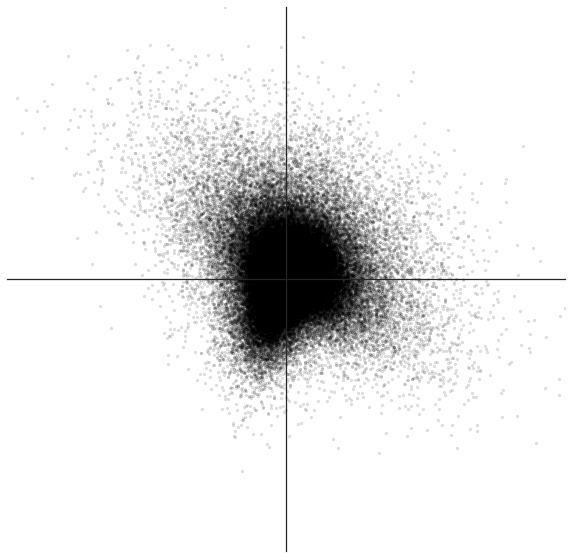

In [43]:
plt.figure(figsize=(10,10))
## code below is to center axes at 0,0
ax = plt.gca()
ax.spines['top'].set_color('none')
ax.spines['left'].set_position('zero')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_position('zero')

plt.scatter(peak_zscores_df['PC1 zscore']/np.max(peak_zscores_df['PC1 zscore']), 
            peak_zscores_df['PC2 zscore']/np.max(peak_zscores_df['PC2 zscore']),
            s=5,color='black',alpha=0.1)

for peak in subset_peaks:
    plt.scatter(peak_zscores_df.loc[peak,'PC1 zscore']/np.max(peak_zscores_df['PC1 zscore']),
        peak_zscores_df.loc[peak,'PC2 zscore']/np.max(peak_zscores_df['PC2 zscore']),
        s=300,color='mediumslateblue')
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.xticks([])
plt.yticks([])
plt.xlabel("PC1")
sns.despine()

### Biological functional enrichment of each cluster of dynamic peaks (across the cell types)

In [386]:
#get genes with TSS info
gene_TSS = pd.DataFrame(pd.read_csv("/data/srlab/agupta/data/ref_files/genes_with_TSS.txt",index_col=3,sep='\t'))
# expand the window around TSS to get roughly promoter regions
window_size = 1e3
window_starts, window_ends = [], []
for gene in gene_TSS.index:
    window_starts.append(max(0, int(gene_TSS.loc[gene,'TSS']-window_size)))
    window_ends.append(max(0,int(gene_TSS.loc[gene,'TSS']+window_size)))

gene_TSS['promoter_window_starts'], gene_TSS['promoter_window_ends'] = window_starts, window_ends
gene_TSS_for_overlaps = gene_TSS[['chr','promoter_window_starts','promoter_window_ends']]

gene_TSS_for_overlaps

,chr,promoter_window_starts,promoter_window_ends
gene,,,
MIR1302-2HG,chr1,28910,30910
FAM138A,chr1,35077,37077
OR4F5,chr1,64419,66419
OR4F29,chr1,450678,452678
OR4F16,chr1,685673,687673
...,...,...,...
TTTY17C,chrY,25212389,25214389
LINC00266-4P,chrY,25392164,25394164
CDY1,chrY,25621162,25623162


In [387]:
## use only genes expressed in at least 50 cells (for each of the 5 cell types)

genes_keep = list(set(RNA_all.var_names).intersection(set(gene_TSS_for_overlaps.index)))
genes_keep_adata = RNA_all[:,genes_keep]
genes_keep_adata = genes_keep_adata[:,genes_keep_adata.var['n_cells']>50]
final_genes_check = list(genes_keep_adata.var_names)

gene_TSS_for_overlaps_final = gene_TSS_for_overlaps.loc[final_genes_check,:]
gene_TSS_for_overlaps_final

,chr,promoter_window_starts,promoter_window_ends
gene,,,
UBE2J1,chr6,89351722,89353722
COL21A1,chr6,56159738,56161738
LINC00603,chr5,39950525,39952525
TBC1D5,chr3,17725469,17727469
ITGAL,chr16,30485087,30487087
...,...,...,...
DGCR8,chr22,20090475,20092475
GMPR,chr6,16268006,16270006
NPAS2,chr2,100935334,100937334


**checking for T cell important genes in our data (for fig2 and text)**

In [70]:
genes_check_fig2 = []
for g in ['CD4','CD8A','IL7R','CD27','CD29','CD294','CD26','CD38','CD62L', #T cell lineage markers
         'CD69','CD161','CD5','CD25', #activation markers
          'CXCR3','CCR4','CCR5','CCR6','CCR7', #costimulatory markers
          'BTLA','PD-1','TIGIT','ICOS','CD48','CD244','CD28', #migration markers
          'CCL4L2','CCL3L1','TNF','TNFSF9','CCL5','IFNG','TNFSF14','CLCF1'
         ]:
    if g in gene_TSS_for_overlaps_final.index:
        # print(g)
        genes_check_fig2.append(g)
len(genes_check_fig2)

T_genes_loci_df = gene_TSS_for_overlaps_final.loc[genes_check_fig2,:]
T_genes_loci_df

,chr,promoter_window_starts,promoter_window_ends
gene,,,
CD4,chr12,6792358,6794358
CD8A,chr2,86794257,86796257
IL7R,chr5,35860142,35862142
CD27,chr12,6444154,6446154
CD38,chr4,15784962,15786962
CD69,chr12,9759901,9761901
CD5,chr11,61101499,61103499
CXCR3,chrX,71617510,71619510
CCR4,chr3,32950644,32952644


**mapping genes to peak clusters**

In [132]:
#takes ~2 min to run
peak_gene_mapping_dict = dict()

for cluster in np.arange(0,12,1): #up to the total number of clusters present
    print(cluster)
    #get the peak subsets (based on Leiden cluster num)
    this_peak_set = ATAC[:,ATAC.var['leiden']==str(cluster)]
    # peaks within this cluster, structured properly
    cluster_peaks_df = pd.DataFrame(columns=['chr','start','end'])
    cluster_peaks_df['chr'] = [str(i).split(':')[0] for i in list(this_peak_set.var_names)]
    cluster_peaks_df['start'] = [int(str(i).split(':')[1].split('-')[0])-500 for i in list(this_peak_set.var_names)]
    cluster_peaks_df['end'] = [int(str(i).split(':')[1].split('-')[1])+500 for i in list(this_peak_set.var_names)]
    
    #for each cluster, check overlap of peaks with genes (ie get the set of genes whose promoters overlap peaks)
    peak_set = cluster_peaks_df
    
    overlapping_genes_set = set()
    
    for chrnum in np.arange(1,23,1):
        chrname = 'chr'+str(chrnum)
        chr_DYN_peaks_df = peak_set[peak_set['chr']==chrname]
        chr_TSS_df = gene_TSS_for_overlaps_final[gene_TSS_for_overlaps_final['chr']==chrname]

        #loop through peak windows (for dynamic peaks for now) -- to build up an interval tree with all peaks
        # print('looping through DYNAMIC peaks')
        peaks_tree = IntervalTree()
        for peak_i in range(len(chr_DYN_peaks_df)):
            peakstart,peakend = chr_DYN_peaks_df.iloc[peak_i,:]['start'],chr_DYN_peaks_df.iloc[peak_i,:]['end']
            peaks_tree[peakstart:peakend]=chrname+":"+str(peakstart)+"-"+str(peakend)

        #for ACTIVE promoters (expressed genes)
        ##loop through gene promoter regions (TSS +/- 1kb --> 2kb around TSS)
        for gene_prom_i in range(len(chr_TSS_df)):
            pstart,pend=chr_TSS_df.iloc[gene_prom_i,:]['promoter_window_starts'], chr_TSS_df.iloc[gene_prom_i,:]['promoter_window_ends']
            #get all peaks that fall within this gene's TSS window
            if len(sorted(peaks_tree[pstart:pend]))>0:
                overlapping_genes_set.add(chr_TSS_df.index[gene_prom_i])
                
    peak_gene_mapping_dict[cluster] = overlapping_genes_set

0
1
2
3
4
5
6
7
8
9
10
11


In [377]:
# print the list of genes relevant for each peak set (ie whose promoters overlap these peak sets)
length=0
for key in peak_gene_mapping_dict:
    if key == 9:
        for gene in peak_gene_mapping_dict[key]:
            print(gene)
            length+=1
            
print(length)

SOWAHC
RAC3
ATF4
CREG1
BORCS5
EBPL
FBXO30
ZNF319
C12orf57
NSL1
EGR3
SLC35B2
PTMA
RCC1L
MTA2
GBGT1
TSPO
COA6
LINC01315
NUDT22
C21orf91
NATD1
CRIP2
COMMD3
SGPP1
BMF
SLC35E4
ENO1
DXO
NPRL2
EEF1A1
FAM89B
ORC6
AURKB
CCDC167
RSL1D1
UBAC2-AS1
THAP3
SAPCD2
TMEM138
HOMEZ
HIGD2A
ZNF564
RABIF
ZKSCAN5
CYB5B
SAP30L-AS1
XPNPEP3
C9orf43
ING1
ZNF33A
CACFD1
ARHGEF19
FOXN3-AS1
SRPRA
MAPK11
MRPS16
POLE3
CCDC183
FAM117B
SF3B5
UBXN2A
PLEKHF2
CHRNB1
ATP6V1F
VAMP1
CNP
CTSA
MON1B
OGFR
C1orf52
SOD2-OT1
GGN
STAT6
IDH1
PHOSPHO1
EME2
MSMO1
RAB23
MAPKAPK3
UBE2S
RBM15
CASTOR1
IL17RD
ZNF706
MKKS
MRPL44
MRFAP1L1
TMEM129
TENT5C
TSSK6
FPGT
PTS
PHYH
HILPDA
CEBPB-AS1
BRMS1
TIPARP
KCTD5
NEURL2
NOP10
LRFN4
GMPPB
RALY-AS1
LINC00337
ABHD17B
CDC42EP2
BHLHE41
DCTPP1
TMCO6
SHARPIN
LYPLA2
TCP11L2
BABAM1
POLH
SLC2A4RG
PAIP2B
ZNF446
TMUB1
MTHFD2
FAM171A2
EPB41L4A-AS1
SNHG21
THAP9
GABARAP
EVA1B
FKBPL
SPC24
TDRKH-AS1
CNPY3
STX5
CALM1
SPRYD4
UBTD2
TMEM44-AS1
LIN7C
TRIP10
TMX2
C11orf95
LSM8
WASL
RNF227
RABGGTA
RALB
ERICD
ISCA2
YOD1
CO

### Checking dynamic and invariant peak Odds Ratio for promoters vs enhancers (check if overlapping gene promoters here)

In [399]:
## mappings dyn peaks and inv peaks to promoters (count whether each peak falls in ANY gene promoter)

# get all dynamic and all invariant peaks
pks_for_EP = pd.DataFrame(np.array(all_ct_reg_pvals_df_forUpsetplot.reset_index().sum(axis=1)),
             index=all_ct_reg_pvals_df.index)

inv_pks_for_EP = pks_for_EP[pks_for_EP==0].dropna(axis=0)
dyn_pks_for_EP = pks_for_EP[pks_for_EP>0].dropna(axis=0)
###############################

## make in correct format (start end etc)
peaks_use_df = dyn_pks_for_EP
dyn_pks_for_EP_sep = pd.DataFrame(columns=['chr','start','end'])
dyn_pks_for_EP_sep['chr'] = [str(i).split(':')[0] for i in list(peaks_use_df.index)]
dyn_pks_for_EP_sep['start'] = [int(str(i).split(':')[1].split('-')[0]) for i in list(peaks_use_df.index)] #-500
dyn_pks_for_EP_sep['end'] = [int(str(i).split(':')[1].split('-')[1]) for i in list(peaks_use_df.index)]

peaks_use_df = inv_pks_for_EP
inv_pks_for_EP_sep = pd.DataFrame(columns=['chr','start','end'])
inv_pks_for_EP_sep['chr'] = [str(i).split(':')[0] for i in list(peaks_use_df.index)]
inv_pks_for_EP_sep['start'] = [int(str(i).split(':')[1].split('-')[0]) for i in list(peaks_use_df.index)] #-500
inv_pks_for_EP_sep['end'] = [int(str(i).split(':')[1].split('-')[1]) for i in list(peaks_use_df.index)]

dyn_pks_for_EP_sep, inv_pks_for_EP_sep

(         chr      start        end
 0       chr1     827432     827632
 1       chr1     869776     869976
 2       chr1     904365     904565
 3       chr1     904661     904861
 4       chr1     905315     905515
 ...      ...        ...        ...
 122227  chrX  151697607  151697807
 122228  chrX  151789224  151789424
 122229  chrX  151826162  151826362
 122230  chrX  151970729  151970929
 122231  chrX  151982272  151982472
 
 [122232 rows x 3 columns],
         chr      start        end
 0      chr1    1471006    1471206
 1      chr1    1861103    1861303
 2      chr1    2226816    2227016
 3      chr1    2230743    2230943
 4      chr1    2544001    2544201
 ...     ...        ...        ...
 10229  chrX    9337147    9337347
 10230  chrX   13377466   13377666
 10231  chrX   18833387   18833587
 10232  chrX   70168708   70168908
 10233  chrX  140765103  140765303
 
 [10234 rows x 3 columns])

In [431]:
peak_gene_mapping_dict = dict()

#for each cluster, check overlap of peaks with genes (ie get the set of genes whose promoters overlap peaks)
peak_set = inv_pks_for_EP_sep

overlapping_genes_set = set()
overlapping_peaks_set = set()

for chrnum in np.arange(1,23,1): #up to 23
    print(chrnum)
    chrname = 'chr'+str(chrnum)
    chr_DYN_peaks_df = peak_set[peak_set['chr']==chrname] #peak set df
    chr_TSS_df = gene_TSS_for_overlaps_final[gene_TSS_for_overlaps_final['chr']==chrname] #gene promoter set df

    #loop through peak windows to build up an interval tree with all peaks
    print('looping through peaks')
    peaks_tree = IntervalTree()
    for peak_i in range(len(chr_DYN_peaks_df)):
        peakstart,peakend = chr_DYN_peaks_df.iloc[peak_i,:]['start'],chr_DYN_peaks_df.iloc[peak_i,:]['end']
        peaks_tree[peakstart:peakend]=chrname+":"+str(peakstart)+"-"+str(peakend)

    #for ACTIVE promoters (expressed genes)
    ##loop through gene promoter regions (TSS +/- 1kb --> 2kb around TSS)
    print('looping through expressed gene promoters')
    for gene_prom_i in range(len(chr_TSS_df)):
        pstart,pend=chr_TSS_df.iloc[gene_prom_i,:]['promoter_window_starts'], chr_TSS_df.iloc[gene_prom_i,:]['promoter_window_ends']
        #get all peaks that fall within this gene's TSS window
        if len(sorted(peaks_tree[pstart:pend]))>0:
            # print('looping through peaks that overlap with this gene')
            for peak_i in range(len(list(peaks_tree[pstart:pend]))):
                overlapping_peaks_set.add(list(peaks_tree[pstart:pend])[peak_i][2])

1
looping through peaks
looping through expressed gene promoters
2
looping through peaks
looping through expressed gene promoters
3
looping through peaks
looping through expressed gene promoters
4
looping through peaks
looping through expressed gene promoters
5
looping through peaks
looping through expressed gene promoters
6
looping through peaks
looping through expressed gene promoters
7
looping through peaks
looping through expressed gene promoters
8
looping through peaks
looping through expressed gene promoters
9
looping through peaks
looping through expressed gene promoters
10
looping through peaks
looping through expressed gene promoters
11
looping through peaks
looping through expressed gene promoters
12
looping through peaks
looping through expressed gene promoters
13
looping through peaks
looping through expressed gene promoters
14
looping through peaks
looping through expressed gene promoters
15
looping through peaks
looping through expressed gene promoters
16
looping through 

In [433]:
len(overlapping_peaks_set)

# 10259/122232 DYNAMIC peaks overlap with gene promoters
# 848/10234 INVARIANT peaks overlap with gene promoters

848/10234, 10259/122232

(0.08286105139730311, 0.08393055828261012)

In [447]:
122232-10259, 10234-848, 111973/122232, 9386/10234 #num not overlapping in each peak set

(111973, 9386, 0.9160694417173899, 0.9171389486026968)

In [446]:
#contingency table for odds ratio
#https://rowannicholls.github.io/python/statistics/risk/odds_ratio.html
#https://stackoverflow.com/questions/43261747/a-better-way-to-calculate-odd-ratio-in-pandas
dyn=[10259, 111973]
inv=[848, 10234]
dct = {
    True: inv,
    False: dyn,
}
contingency_table = pd.DataFrame(dct, index=[True, False])

print(contingency_table)

odds = contingency_table[True] / contingency_table[False]
odds_ratio = odds[True] / odds[False]
# print('Odds ratio: ', odds_ratio)

import scipy.stats as stats
table = np.array([inv,
           dyn])
oddsratio, pvalue = stats.fisher_exact(table)
print("Odds Ratio:", oddsratio, "pvalue:", pvalue)

        True   False
True     848   10259
False  10234  111973
Odds Ratio: 0.904396189502897 pvalue: 0.0067137842289357215
